## Código de honor

“Al entregar la solución de este parcial, yo, <span style="color:red"> Ernesto Duarte</span> con código <span style="color:red">202014279</span> me comprometo a no conversar durante el desarrollo de este examen con ninguna persona que no sea el profesor del curso, sobre aspectos relacionados con el parcial; tampoco utilizaré algún medio de comunicación por voz, texto o intercambio de archivos, para consultar o compartir con otros, información sobre el tema del parcial. Soy consciente y acepto las consecuencias que acarreará para mi desempeño académico cometer fraude en este parcial”.

# Desarrollo Parcial

## Imports y carga de datos

In [423]:
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns

from joblib import dump, load
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
import pandas_profiling as pp
from sklearn.preprocessing import RobustScaler

# Para la validación cruzada
from sklearn.model_selection import KFold


import scipy.stats as stats
from sklearn import tree

In [329]:
df = pd.read_csv('./Datos_pacientes_etapa1.csv', encoding="ISO-8859-1", sep=';')
df.head()

,id,edad,sexo,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,ejercicio_angina,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree,enfermedad_cardiaca,tipo_de_residencia,estado_de_fumador
0,2338,40,NaN,1,114,125,173,1,88.0,43.0,169.0,27.844196,0.510280,1,Urban,Smoker
1,5208,88,0.0,4,120,121,180,0,98.0,75.0,117.0,15.005286,2.350916,0,Urban,Unknown
2,735,46,1.0,1,23,138,94,1,223.0,67.0,108.0,31.307352,0.688744,1,NaN,Non-Smoker
3,4979,62,NaN,2,180,249,114,0,228.0,76.0,100.0,44.811208,0.116776,1,Urban,Smoker
4,4736,88,NaN,1,157,295,71,0,249.0,53.0,103.0,43.480184,0.712773,0,Urban,Non-Smoker


In [330]:
df.shape

(1000, 16)

Decidimos que la variable objetivo será 'enfermedad cardiaca', puesto que con los datos sumisnitrados, podríamos determinar si una persona tiene riesgo o no de sufrir este problema

In [347]:
# Seleccionar la variable objetivo
Y = df['enfermedad_cardiaca']

In [348]:
# Seleccionar las variables predictoras
X = df.drop(['enfermedad_cardiaca'], axis=1)

In [349]:
# Dividir el conjunto de datos en entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0, stratify=Y)

In [334]:
X_train.head()

,id,edad,sexo,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,ejercicio_angina,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree,tipo_de_residencia,estado_de_fumador
616,5274,25,NaN,1,140,234,211,1,100.0,26.0,111.0,49.559217,0.446997,Rural,Non-Smoker
341,927,80,1.0,3,115,172,107,1,212.0,77.0,80.0,28.746581,0.662005,Rural,Non-Smoker
673,642,24,1.0,3,145,184,210,0,223.0,90.0,110.0,23.149062,1.501508,Urban,Unknown
638,4208,29,1.0,2,131,185,71,1,149.0,46.0,176.0,44.205290,0.613883,Rural,Non-Smoker
367,4120,27,1.0,3,177,150,149,0,240.0,99.0,165.0,35.100828,0.408634,Urban,Smoker


## 1. Enfoque Analítico

El enfoque análitico que le daremos al ejercicio de consultoría es el siguiente. Primero, se va valorar la calidad de los datos y analizarlos según sus valores y reglas del negocio. Los valores que se salgan del rango establecido para la muestra de datos, (dependiendo su porcentaje) se ajustarán para que lo cumplan, se corregirán los valores String que no correspondan a los definidos para la muestra y se hará un *encoding* de los valores de las variables categóricas.

Se va a elegir la variable objetivo (*enfermedad_cardiaca*). Luego, se va a revisar la correlación entre cada *feature* elegida, para entender cuales -tal vez- no son tan necesarias o su efecto se ve reflejado en otra variable.

Finalmente, se va a entrenar un modelo de aprendizaje supervisado de clasificación. Se clasifica como supervisado, porque le estamos dando las características que tienen que tener en cuenta al momento de clasificar. Este modelo se va a entrenar usando datos de entrenamiento que nos ayudan a predecir sobre datos de prueba. Los modelos están orientados a dos algoritmos de clasificación: Árbol de Decisión y Bosque de Árboles de Decisión. Para cada uno, analizaremos sus métricas y veremos cuál nos da un modelo más generalizado para posibles datos de prueba futuros.

## 2. Análisis exploratorio y de calidad de datos

### Limpieza y revisión de datos

Para empezar a entender los datos, debemos revisar el tamaño total de los mismos, además de sus tipos.

In [269]:
X_train.head()

,id,edad,sexo,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,ejercicio_angina,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree,tipo_de_residencia,estado_de_fumador
616,5274,25,NaN,1,140,234,211,1,100.0,26.0,111.0,49.559217,0.446997,Rural,Non-Smoker
341,927,80,1.0,3,115,172,107,1,212.0,77.0,80.0,28.746581,0.662005,Rural,Non-Smoker
673,642,24,1.0,3,145,184,210,0,223.0,90.0,110.0,23.149062,1.501508,Urban,Unknown
638,4208,29,1.0,2,131,185,71,1,149.0,46.0,176.0,44.205290,0.613883,Rural,Non-Smoker
367,4120,27,1.0,3,177,150,149,0,240.0,99.0,165.0,35.100828,0.408634,Urban,Smoker


In [270]:
X_train.dtypes

id                              int64
edad                            int64
sexo                          float64
tipo_dolor_de_pecho             int64
presion_sanguinea               int64
colesterol                      int64
frecuencia_cardiaca_maxima      int64
ejercicio_angina                int64
glucosa_plasma                float64
grosor_piel                   float64
insulina                      float64
bmi                           float64
diabetes_pedigree             float64
tipo_de_residencia             object
estado_de_fumador              object
dtype: object

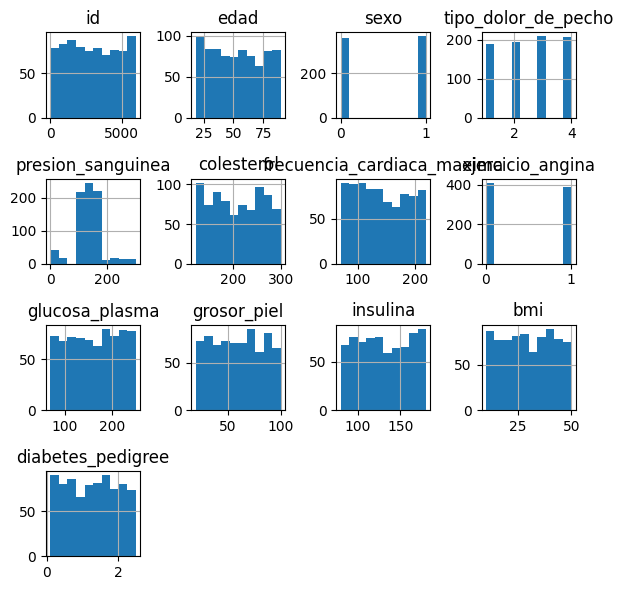

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


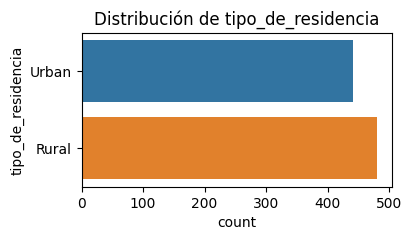

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


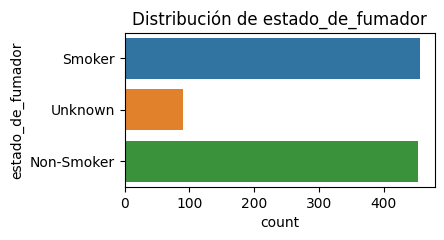

In [271]:
# Histogramas para variables numéricas
X_train.select_dtypes(include=[float, int]).hist(figsize=(6, 6))
plt.tight_layout()
plt.show()

# Gráficos de barras para variables categóricas
for col in X_train.select_dtypes(include='object').columns:
    plt.figure(figsize=(4, 2))
    sns.countplot(y=df[col])
    plt.title(f'Distribución de {col}')
    plt.show()

Ahora, se revisa el porcentaje de valores nulos de cada columna del DataFrame.

In [350]:
(X_train.isnull().sum() / X_train.shape[0]).sort_values(ascending=False)

insulina                      0.10500
glucosa_plasma                0.09250
sexo                          0.09125
grosor_piel                   0.08750
tipo_de_residencia            0.08500
id                            0.00000
edad                          0.00000
tipo_dolor_de_pecho           0.00000
presion_sanguinea             0.00000
colesterol                    0.00000
frecuencia_cardiaca_maxima    0.00000
ejercicio_angina              0.00000
bmi                           0.00000
diabetes_pedigree             0.00000
estado_de_fumador             0.00000
dtype: float64

In [351]:
X_train.describe()

,id,edad,sexo,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,ejercicio_angina,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree
count,800.000000,800.000000,727.000000,800.000000,800.000000,800.000000,800.000000,800.000000,726.000000,730.000000,716.000000,800.000000,800.000000
mean,2999.091250,52.755000,0.504814,2.545000,134.100000,207.117500,141.496250,0.486250,161.743802,59.335616,130.231844,29.898142,1.278709
std,1766.446807,21.390522,0.500321,1.114463,48.632514,53.854053,44.291276,0.500124,52.444208,23.082805,29.624350,11.635819,0.693062
min,25.000000,18.000000,0.000000,1.000000,0.000000,120.000000,70.000000,0.000000,70.000000,20.000000,80.000000,10.038795,0.100870
25%,1460.250000,34.000000,0.000000,2.000000,110.000000,160.750000,104.000000,0.000000,116.000000,39.000000,104.750000,19.713241,0.688276
50%,2942.000000,52.000000,1.000000,3.000000,137.000000,208.000000,138.000000,0.000000,162.000000,60.000000,128.500000,29.283933,1.296924
75%,4531.250000,71.250000,1.000000,4.000000,159.000000,255.000000,182.000000,1.000000,208.750000,79.000000,157.000000,40.201878,1.879248
max,5998.000000,90.000000,1.000000,4.000000,299.000000,300.000000,220.000000,1.000000,250.000000,100.000000,180.000000,49.999449,2.499582


Se van a examinar los diferentes datos de cada columna categorica, para revisar si hubo errores en la toma de los mismos (errores de formato y/o rango).

In [352]:
# Agregar/eliminar variable objetivo (no está 'enfermedad cardiaca')
features = "edad	sexo	tipo_dolor_de_pecho	presion_sanguinea	colesterol	frecuencia_cardiaca_maxima	ejercicio_angina	glucosa_plasma	grosor_piel	insulina	bmi	diabetes_pedigree tipo_de_residencia estado_de_fumador".split()
features

['edad',
 'sexo',
 'tipo_dolor_de_pecho',
 'presion_sanguinea',
 'colesterol',
 'frecuencia_cardiaca_maxima',
 'ejercicio_angina',
 'glucosa_plasma',
 'grosor_piel',
 'insulina',
 'bmi',
 'diabetes_pedigree',
 'tipo_de_residencia',
 'estado_de_fumador']

In [353]:
featuresNumericas = ['edad', 'presion_sanguinea', 'colesterol', 'frecuencia_cardiaca_maxima','grosor_piel', 'insulina', 'bmi', 'diabetes_pedigree']
featuresCategoricas = ['sexo', 'tipo_dolor_de_pecho', 'ejercicio_angina', 'glucosa_plasma','tipo_de_residencia','estado_de_fumador']

In [354]:
# Revisar features categoricas
for feature in featuresCategoricas:
    print(f"{feature}: {X_train[feature].unique()}")

sexo: [nan  1.  0.]
tipo_dolor_de_pecho: [1 3 2 4]
ejercicio_angina: [1 0]
glucosa_plasma: [100. 212. 223. 149. 240.  76. 156. 230. 136. 112. 177. 197.  91. 131.
  nan  97. 211. 119. 204. 225. 214. 153. 157. 250. 116. 203. 235.  72.
  74. 158. 102.  84. 199. 202. 110. 128. 137. 193. 231.  88. 238.  85.
  98. 107.  71. 127. 216. 229. 140.  86. 188. 195. 244. 209. 120. 243.
 179. 181.  81. 139.  73. 118. 133. 245. 239. 162.  75. 241.  92. 129.
 207. 101. 111. 174. 154.  80. 143. 171. 132. 185. 215.  82. 224. 228.
 104. 145. 213. 249. 134. 232. 175. 205. 190. 227. 166. 108. 168. 192.
 208. 169. 115.  93. 125.  87. 206. 237. 176. 226. 182. 220. 233. 167.
 106.  96. 161. 236. 148.  89. 217. 242. 222.  94. 196. 234. 159. 191.
 123. 187. 142. 105. 178. 172. 144. 173.  77.  90. 126. 122. 210. 121.
 151. 201. 186. 109. 221. 194. 219.  99.  79. 163. 247. 246. 103. 165.
 113. 189.  78. 180. 152. 130. 184. 150. 141.  83. 155.  95. 117. 146.
  70. 160. 218. 135. 164. 147. 248. 124. 114. 170. 198. 2

#### Observaciones 
1. Feature "glucosa_plasma" está catalogada en el diccionario provisto como categórica, sin embargo, sus valores son numericos además de lo conocido sobre la variable.
2. Los valores de las categorías están escritos correctamente, excepto por valores null

Se realiza el cambio en el tratamiento de la variable "glucosa_plasma" de categórica a numérica.

Justificación del Cambio:

1. Análisis de los Datos:
Al observar los valores únicos y el tipo de datos de la variable glucosa_plasma en el conjunto de datos proporcionado, se determina que los valores son numéricos y no categóricos, como se menciona en el diccionario de datos.
2. Consistencia con la Realidad:
Desde un punto de vista médico y biológico, los niveles de glucosa en plasma se miden en términos numéricos, y por lo tanto, tiene sentido tratar esta variable como numérica.
3. Modelado:
Tratar glucosa_plasma como una variable numérica permitirá una mejor interpretación y modelado de los datos, ya que se podrán aplicar técnicas estadísticas y de aprendizaje automático más adecuadas para variables numéricas, como la normalización.
4. Conclusión:
Basándose en el análisis de los datos y en la consistencia con la realidad médica, se justifica el cambio en el tratamiento de la variable glucosa_plasma a numérica para un análisis más preciso y un mejor rendimiento del modelo.

In [355]:
featuresNumericas += ['glucosa_plasma']
featuresCategoricas.remove('glucosa_plasma')


In [359]:
# Eliminar valores null de features categóricas, que no representen más de un 30% de la columna, reemplazandolos por la moda.
for feature in featuresCategoricas:
    moda = X_train[feature].mode()[0]
    if (X_train[feature].isnull().sum() / X_train.shape[0]) < 0.3:
        X_train[feature] = X_train[feature].fillna(moda)
        X_test[feature] = X_test[feature].fillna(moda)

In [360]:
X_train.shape

(800, 15)

No se ha perdido información. Hay 800 registros en el x_train por el split al inicio con info de entrenamiento y de prueba.

In [361]:
# eliminar valores null de features numericas, reemplazandolos por la mediana, que no representen más de un 30% de la columna.
for feature in featuresNumericas:
    mediana = X_train[feature].median()
    if (X_train[feature].isnull().sum() / X_train.shape[0]) < 0.3:
        X_train[feature] = X_train[feature].fillna(mediana)
        X_test[feature] = X_test[feature].fillna(mediana)

In [363]:
# Revisar valores null
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 800 entries, 616 to 312
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          800 non-null    int64  
 1   edad                        800 non-null    int64  
 2   sexo                        800 non-null    float64
 3   tipo_dolor_de_pecho         800 non-null    int64  
 4   presion_sanguinea           800 non-null    int64  
 5   colesterol                  800 non-null    int64  
 6   frecuencia_cardiaca_maxima  800 non-null    int64  
 7   ejercicio_angina            800 non-null    int64  
 8   glucosa_plasma              800 non-null    float64
 9   grosor_piel                 800 non-null    float64
 10  insulina                    800 non-null    float64
 11  bmi                         800 non-null    float64
 12  diabetes_pedigree           800 non-null    float64
 13  tipo_de_residencia          800 non-nu

In [364]:
# Revisar features numericas, describiendolas
X_train[featuresNumericas].describe()

,edad,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,grosor_piel,insulina,bmi,diabetes_pedigree,glucosa_plasma
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,52.755000,134.100000,207.117500,141.496250,59.393750,130.050000,29.898142,1.278709,161.767500
std,21.390522,48.632514,53.854053,44.291276,22.049295,28.028927,11.635819,0.693062,49.956687
min,18.000000,0.000000,120.000000,70.000000,20.000000,80.000000,10.038795,0.100870,70.000000
25%,34.000000,110.000000,160.750000,104.000000,41.000000,108.000000,19.713241,0.688276,120.750000
50%,52.000000,137.000000,208.000000,138.000000,60.000000,128.500000,29.283933,1.296924,162.000000
75%,71.250000,159.000000,255.000000,182.000000,77.000000,153.250000,40.201878,1.879248,204.000000
max,90.000000,299.000000,300.000000,220.000000,100.000000,180.000000,49.999449,2.499582,250.000000


1. Cumple con la restricción de que la edad mínima sean 17 años. (mínimo 18 años)
2. La variable 'presion_sanguinea' cuenta con datos menores al rango, podrían considerarse como outliers que serán tratados a continuación, por lo que no se corrigen en este paso

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


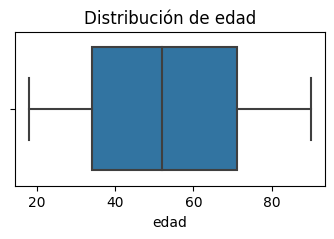

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


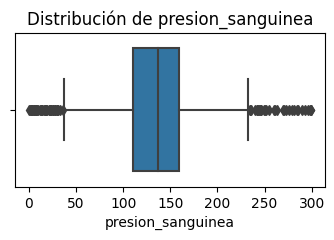

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


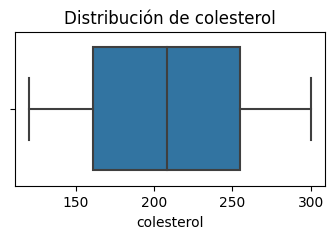

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


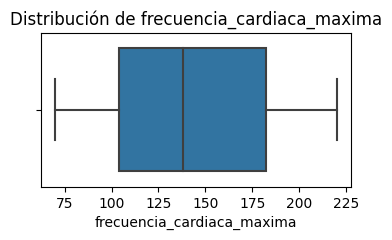

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


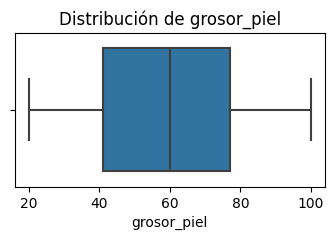

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


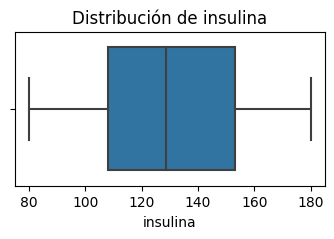

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


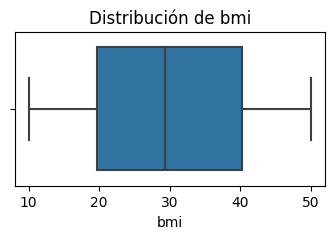

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


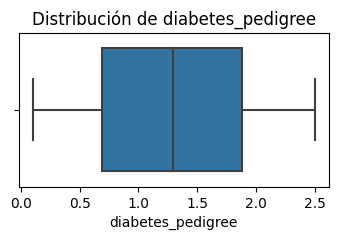

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


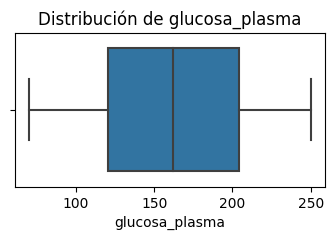

In [365]:
# Visualizar outliers
for feature in featuresNumericas:
    plt.figure(figsize=(4, 2))
    sns.boxplot(x=X_train[feature])
    plt.title(f'Distribución de {feature}')
    plt.show()

In [366]:
# Verificar la media y mediana para cada variable numérica
for feature in featuresNumericas:
    print(f"{feature}: {X_train[feature].mean()}, {X_train[feature].median()}")

edad: 52.755, 52.0
presion_sanguinea: 134.1, 137.0
colesterol: 207.1175, 208.0
frecuencia_cardiaca_maxima: 141.49625, 138.0
grosor_piel: 59.39375, 60.0
insulina: 130.05, 128.5
bmi: 29.8981416068125, 29.28393268
diabetes_pedigree: 1.27870853879125, 1.296924357
glucosa_plasma: 161.7675, 162.0


Ya que son similares, entonces se reemplaza con cualquiera de las dos, en este caso, la mediana.

In [373]:
# Reemplazar outliers por el valor de la mediana con metodo de quartiles
for feature in featuresNumericas:
    Q1 = X_train[feature].quantile(0.25)
    Q3 = X_train[feature].quantile(0.75)
    IQR = Q3 - Q1
    X_train[feature] = np.where(X_train[feature] < (Q1 - 1.5 * IQR), X_train[feature].median(), X_train[feature])
    X_train[feature] = np.where(X_train[feature] > (Q3 + 1.5 * IQR), X_train[feature].median(), X_train[feature])
    X_test[feature] = np.where(X_test[feature] < (Q1 - 1.5 * IQR), X_test[feature].median(), X_test[feature])
    X_test[feature] = np.where(X_test[feature] > (Q3 + 1.5 * IQR), X_test[feature].median(), X_test[feature])

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


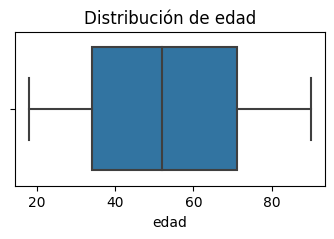

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


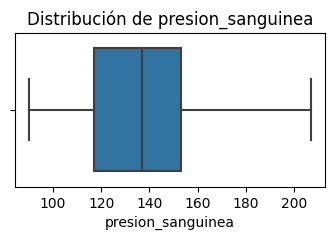

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


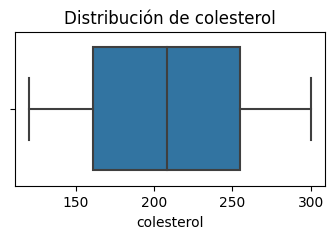

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


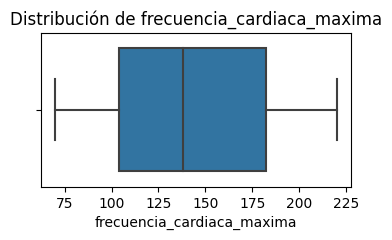

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


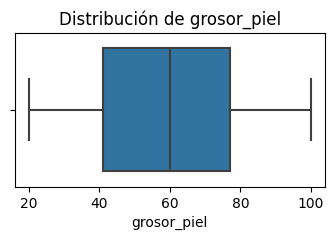

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


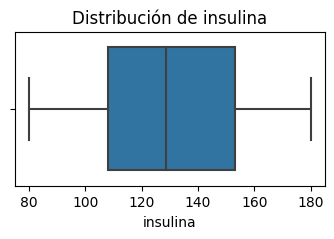

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


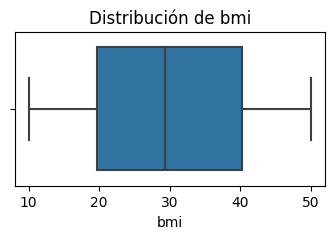

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


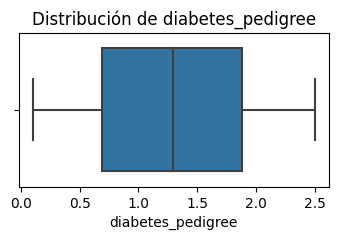

/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


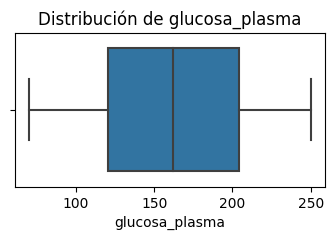

In [374]:
# Visualizar outliers
for feature in featuresNumericas:
    plt.figure(figsize=(4, 2))
    sns.boxplot(x=X_train[feature])
    plt.title(f'Distribución de {feature}')
    plt.show()

In [375]:
# Describimos los datos
X_train[featuresNumericas].describe()

,edad,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,grosor_piel,insulina,bmi,diabetes_pedigree,glucosa_plasma
count,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000,800.000000
mean,52.755000,135.991250,207.117500,141.496250,59.393750,130.050000,29.898142,1.278709,161.767500
std,21.390522,24.234693,53.854053,44.291276,22.049295,28.028927,11.635819,0.693062,49.956687
min,18.000000,90.000000,120.000000,70.000000,20.000000,80.000000,10.038795,0.100870,70.000000
25%,34.000000,117.000000,160.750000,104.000000,41.000000,108.000000,19.713241,0.688276,120.750000
50%,52.000000,137.000000,208.000000,138.000000,60.000000,128.500000,29.283933,1.296924,162.000000
75%,71.250000,153.000000,255.000000,182.000000,77.000000,153.250000,40.201878,1.879248,204.000000
max,90.000000,207.000000,300.000000,220.000000,100.000000,180.000000,49.999449,2.499582,250.000000


Luego de tratar los outliers, se eliminaron los valores de presión sanguinea fuera de rango correctamente por lo que ya todas las variables numéricas cumplen con los requisitos de limpieza.

#### Transformación de variables categóricas
Se transformarán las variables categóricas nominales a numéricas. Se excluye la variable "tipo_dolor_de_pecho" por ser cardinal y estar ya con valores numéricos que representan orden.

In [328]:
# info de df
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          800 non-null    int64  
 1   edad                        800 non-null    float64
 2   tipo_dolor_de_pecho         800 non-null    int64  
 3   presion_sanguinea           800 non-null    float64
 4   colesterol                  800 non-null    float64
 5   frecuencia_cardiaca_maxima  800 non-null    float64
 6   glucosa_plasma              800 non-null    float64
 7   grosor_piel                 800 non-null    float64
 8   insulina                    800 non-null    float64
 9   bmi                         800 non-null    float64
 10  diabetes_pedigree           800 non-null    float64
 11  sexo_1.0                    800 non-null    float64
 12  ejercicio_angina_1          800 non-null    float64
 13  tipo_de_residencia_Urban    800 non

In [376]:
ordinal_cols = ['tipo_dolor_de_pecho']
nominal_cols = featuresCategoricas
nominal_cols.remove('tipo_dolor_de_pecho')
target_col = 'enfermedad_cardiaca'

In [377]:
# Codificar variables nominales
ohe = OneHotEncoder(drop='first', sparse=False, handle_unknown='ignore')
encoded = ohe.fit_transform(X_train[nominal_cols])
encoded = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(nominal_cols))


/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [378]:
# Concatenar las variables codificadas con las variables originales
# reset index
X_train.reset_index(drop=True, inplace=True)
encoded.reset_index(drop=True, inplace=True)
X_train = pd.concat([X_train, encoded], axis=1)



In [379]:
# Eliminar las variables originales
X_train.drop(nominal_cols, axis=1, inplace=True)

In [380]:
# Transformar datos test
encodedTest = ohe.transform(X_test[nominal_cols])
encodedTest = pd.DataFrame(encodedTest, columns=ohe.get_feature_names_out(nominal_cols))
X_test.reset_index(drop=True, inplace=True)
encodedTest.reset_index(drop=True, inplace=True)
X_test = pd.concat([X_test, encodedTest], axis=1)
# Eliminar las variables originales
X_test.drop(nominal_cols, axis=1, inplace=True)


In [383]:
X_train.sample(4)

,id,edad,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree,sexo_1.0,ejercicio_angina_1,tipo_de_residencia_Urban,estado_de_fumador_Smoker,estado_de_fumador_Unknown
12,4480,34.0,1,111.0,284.0,156.0,91.0,30.0,87.0,37.505497,0.714104,1.0,1.0,1.0,0.0,0.0
647,4629,30.0,2,145.0,155.0,71.0,195.0,27.0,111.0,28.045443,0.997593,0.0,1.0,0.0,0.0,1.0
576,4320,79.0,4,170.0,135.0,189.0,162.0,20.0,128.5,31.403466,1.586899,0.0,1.0,1.0,0.0,0.0
517,5040,62.0,4,168.0,189.0,141.0,176.0,84.0,174.0,40.339531,1.629205,0.0,1.0,1.0,0.0,1.0


In [384]:
# Eliminar variable 'id'
X_train.drop(['id'], axis=1, inplace=True)
X_test.drop(['id'], axis=1, inplace=True)

In [385]:
X_train.head()

,edad,tipo_dolor_de_pecho,presion_sanguinea,colesterol,frecuencia_cardiaca_maxima,glucosa_plasma,grosor_piel,insulina,bmi,diabetes_pedigree,sexo_1.0,ejercicio_angina_1,tipo_de_residencia_Urban,estado_de_fumador_Smoker,estado_de_fumador_Unknown
0,25.0,1,140.0,234.0,211.0,100.0,26.0,111.0,49.559217,0.446997,1.0,1.0,0.0,0.0,0.0
1,80.0,3,115.0,172.0,107.0,212.0,77.0,80.0,28.746581,0.662005,1.0,1.0,0.0,0.0,0.0
2,24.0,3,145.0,184.0,210.0,223.0,90.0,110.0,23.149062,1.501508,1.0,0.0,1.0,0.0,1.0
3,29.0,2,131.0,185.0,71.0,149.0,46.0,176.0,44.205290,0.613883,1.0,1.0,0.0,0.0,0.0
4,27.0,3,177.0,150.0,149.0,240.0,99.0,165.0,35.100828,0.408634,1.0,0.0,1.0,1.0,0.0


In [386]:
#verificar nans
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 800 entries, 0 to 799
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   edad                        800 non-null    float64
 1   tipo_dolor_de_pecho         800 non-null    int64  
 2   presion_sanguinea           800 non-null    float64
 3   colesterol                  800 non-null    float64
 4   frecuencia_cardiaca_maxima  800 non-null    float64
 5   glucosa_plasma              800 non-null    float64
 6   grosor_piel                 800 non-null    float64
 7   insulina                    800 non-null    float64
 8   bmi                         800 non-null    float64
 9   diabetes_pedigree           800 non-null    float64
 10  sexo_1.0                    800 non-null    float64
 11  ejercicio_angina_1          800 non-null    float64
 12  tipo_de_residencia_Urban    800 non-null    float64
 13  estado_de_fumador_Smoker    800 non

In [387]:

#Perfil de los datos ya limpios y preprocesados
profile = pp.ProfileReport(X_train, title='Pandas Profiling Report', html={'style':{'full_width':True}}) 

profile.to_notebook_iframe()

Summarize dataset:   5%|▌         | 1/20 [00:00<00:01, 10.70it/s, Describe variable:tipo_dolor_de_pecho]

Render HTML: 100%|██████████| 1/1 [00:11<00:00, 11.24s/it]


Se busca un modelo que permita conocer el posible riesgo de enfermedad cardiaca de un paciente. Por esta razón, se va a usar como variable objetivo "enfermedad_cardiaca".

## 3. Entrenamiento modelo Machine Learning

### Machine Learning, Clasificación

#### Selección de *Features*

Las columnas que nos permiten tener una idea clara del riesgo de enfermedad cardiaca, son aquellas que permiten identificar el riesgo.

In [388]:

# Compute the correlation between the numeric features and the target variable
corr_matrix_numeric = X_train[featuresNumericas].corrwith(Y_train)
corr_with_target_numeric = corr_matrix_numeric.sort_values(ascending=False)
print('Correlation between numeric features and target variable:')
print(corr_with_target_numeric)


Correlation between numeric features and target variable:
edad                          0.101735
insulina                      0.039728
grosor_piel                   0.023670
diabetes_pedigree             0.020675
bmi                           0.013104
frecuencia_cardiaca_maxima    0.007359
glucosa_plasma               -0.000858
colesterol                   -0.044398
presion_sanguinea            -0.066141
dtype: float64


No hay correlación entre variables numéricas con la variables objetivo (valores mayores a abs(0.8) ), por lo que todas se utilizan para el modelo.

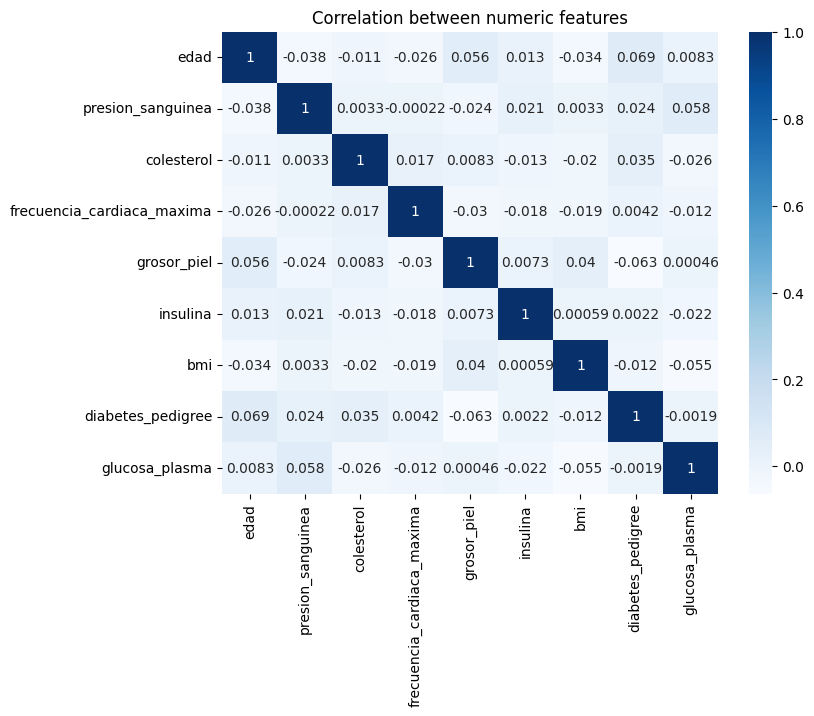

In [389]:
# Verificar la correlación entre las variables numéricas
corr_matrix = X_train[featuresNumericas].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='Blues')
plt.title('Correlation between numeric features')
plt.show()

No hay correlación entre variables

In [390]:
print('Tamaño del conjunto original:', df.shape[0])
print('Tamaño del conjunto de entrenamiento:', X_train.shape[0])
print('Tamaño del conjunto de prueba:', X_test.shape[0])

Tamaño del conjunto original: 1000
Tamaño del conjunto de entrenamiento: 800
Tamaño del conjunto de prueba: 200


In [391]:
Y_train.value_counts(normalize=True)

enfermedad_cardiaca
1    0.50375
0    0.49625
Name: proportion, dtype: float64

In [476]:
Y_test.value_counts(normalize=True)

enfermedad_cardiaca
1    0.505
0    0.495
Name: proportion, dtype: float64

Los conjuntos de datos de entrenamiento y de prueba están bastante balanceado en términos de la variable objetivo (presencia o ausencia de enfermedad cardíaca), con una distribución casi igual entre las dos clases. Esto es beneficioso ya que un conjunto de datos balanceado generalmente conduce a modelos de clasificación más robustos y precisos, evitando el sesgo hacia una clase en particular.

## Árbol de decisión
Vamos a hacer la prueba con el algoritmo de Árbol de Decisión. Vamos a hallar los mejores hiperparámetros inicialmente y luego ejecutar el modelo de árbol. Dependiendo de los resultados, podremos ver si hay un overfitting (error train bajo, error test alto). Si encontramos overfitting, sabremos que debemos controlar la profundidad, haciendola menor.

In [477]:
# Define el modelo
tree_model = DecisionTreeClassifier(random_state=1)

# Define los parámetros a ajustar
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Define el objeto GridSearchCV
grid_search = GridSearchCV(estimator=tree_model, param_grid=param_grid, cv=5, scoring='accuracy')

# Ajusta el modelo
grid_search.fit(X_train, Y_train)

# Obtén los mejores parámetros
best_params = grid_search.best_params_


In [478]:
best_params

{'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 2}

In [479]:
tree_model = DecisionTreeClassifier(max_depth=10, min_samples_leaf=4, min_samples_split=2, random_state=0)

In [480]:
tree_model.fit(X_train, Y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=4, random_state=0)

In [481]:
tree_model.get_depth()

10

In [469]:
# Sacar las columnas de X_train como lista
featuresAct = list(X_train.columns)
featuresAct

['edad',
 'tipo_dolor_de_pecho',
 'presion_sanguinea',
 'colesterol',
 'frecuencia_cardiaca_maxima',
 'glucosa_plasma',
 'grosor_piel',
 'insulina',
 'bmi',
 'diabetes_pedigree',
 'sexo_1.0',
 'ejercicio_angina_1',
 'tipo_de_residencia_Urban',
 'estado_de_fumador_Smoker',
 'estado_de_fumador_Unknown']

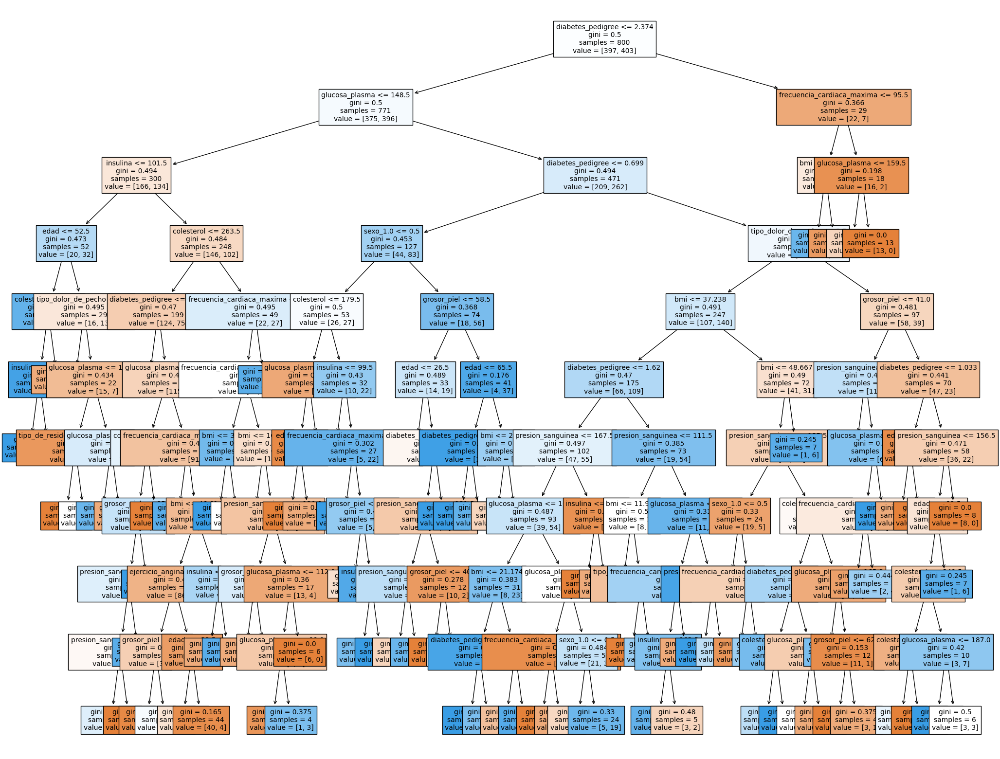

In [498]:
# Visualizar el árbol
fig = plt.figure(figsize=(25, 20))
_ = tree.plot_tree(tree_model, feature_names=featuresAct, filled=True, fontsize=10)

In [500]:
preds_train = tree_model.predict(X_train)
preds_test = tree_model.predict(X_test)

Podemos ver el error del modelo con Matrices de Confusión

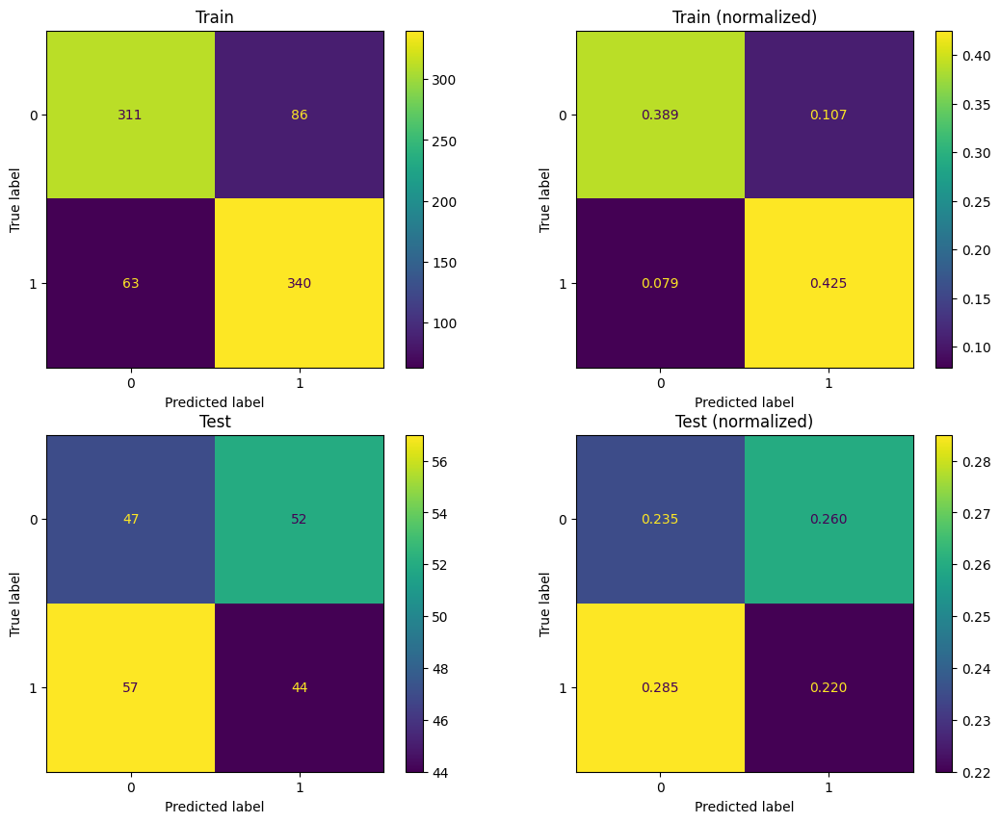

In [501]:
# Matrices de confusión
cm_train = confusion_matrix(Y_train, preds_train,labels=tree_model.classes_)
cm_test = confusion_matrix(Y_test, preds_test,labels=tree_model.classes_)

cm_train_norm = confusion_matrix(Y_train, preds_train,labels=tree_model.classes_, normalize='all')
cm_test_norm = confusion_matrix(Y_test, preds_test,labels=tree_model.classes_, normalize='all')

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (13, 10))
ConfusionMatrixDisplay(confusion_matrix = cm_train, display_labels = tree_model.classes_).plot(ax = ax1, values_format = ',.0f')
ConfusionMatrixDisplay(confusion_matrix = cm_train_norm, display_labels = tree_model.classes_).plot(ax = ax2, values_format = '.3f')
ConfusionMatrixDisplay(confusion_matrix = cm_test, display_labels = tree_model.classes_).plot(ax = ax3, values_format = ',.0f')
ConfusionMatrixDisplay(confusion_matrix = cm_test_norm, display_labels = tree_model.classes_).plot(ax = ax4, values_format = '.3f')

ax1.set_title('Train')
ax2.set_title('Train (normalized)')
ax3.set_title('Test')
ax4.set_title('Test (normalized)')
plt.show()

Con esta matríz de confusión, podemos ver que el modelo está sacando pocos datos clasificados como Errores de Tipo I o Tipo II. Esto es un buen indicio de la calidad del modelo, ya que el porcentaje de datos mal clasificados es poco.

Revisando las métricas accuracy, precision, recall y f1.

In [502]:
pd.DataFrame([
    {
        'Train': accuracy_score(Y_train, preds_train),
        'Test': accuracy_score(Y_test, preds_test)
    },
    {
        'Train': precision_score(Y_train, preds_train),
        'Test': precision_score(Y_test, preds_test)
    },
    {
        'Train': recall_score(Y_train, preds_train),
        'Test': recall_score(Y_test, preds_test)
    },
    {
        'Train': f1_score(Y_train, preds_train),
        'Test': f1_score(Y_test, preds_test)
    }
], index = ['Accuracy', 'Precision', 'Recall', 'F1'])

,Train,Test
Accuracy,0.813750,0.455000
Precision,0.798122,0.458333
Recall,0.843672,0.435644
F1,0.820265,0.446701


#### Interpretación:
Después de realizar múltiples experimentos y ajustes en los modelos, incluyendo la alteración de la profundidad del árbol y la implementación de un árbol aleatorio, los resultados obtenidos no mostraron mejoras significativas en el rendimiento del modelo en el conjunto de datos de prueba. A pesar de que el modelo está bien balanceado y muestra un rendimiento prometedor en el conjunto de entrenamiento, con una precisión del 
81.38
%
81.38%, una exactitud del 
81.38
%
81.38%, un recall del 
84.37
%
84.37%, y un valor F1 del 
82.03
%
82.03%, los resultados en el conjunto de prueba son considerablemente más bajos, con una precisión del 
45.83
%
45.83%, una exactitud del 
45.5
%
45.5%, un recall del 
43.56
%
43.56%, y un valor F1 del 
44.67
%
44.67%.

Verificamos la importancia que da el árbol a cada feature

<Axes: ylabel='Feature'>

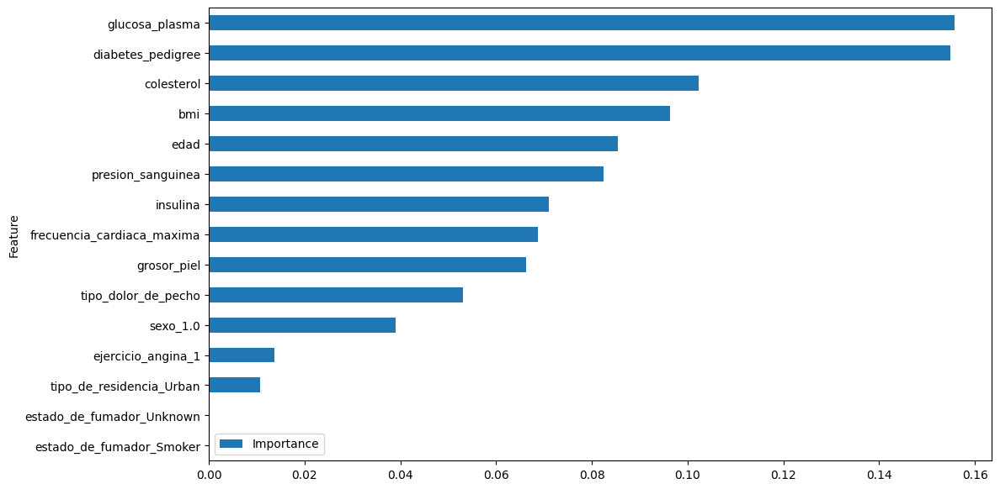

In [447]:
feature_importance_df = pd.DataFrame([featuresAct, tree_model.feature_importances_]).T
feature_importance_df.columns = ['Feature', 'Importance']
feature_importance_df.sort_values(by = 'Importance').plot.barh(x = 'Feature', y = 'Importance', figsize = (12, 7))

In [497]:
tree_model.feature_importances_ 

array([0.06652754, 0.04550698, 0.11675453, 0.11906832, 0.07131614,
       0.16276566, 0.08502491, 0.06395339, 0.10708602, 0.0995633 ,
       0.04436527, 0.01145773, 0.00661023, 0.        , 0.        ])

### Arbol de decision 2

In [453]:
#Definicion del numero de particiones para la validacion cruzada asi como los pa
particiones = KFold(n_splits=5, shuffle=True, random_state=0)
param_grid = {'criterion': ['gini','entropy'], 'max_depth':[4,6,8,9,10,11,12,13,15,],'min_samples_leaf':[2,3,4,5,6,7]}



In [454]:
arbol = DecisionTreeClassifier(random_state=0)


In [455]:
# Buscar mejor modelo
mejor_modelo = GridSearchCV(arbol, param_grid, cv=particiones)
mejor_modelo.fit(X_train,Y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 6, 8, 9, 10, 11, 12, 13, 15],
                         'min_samples_leaf': [2, 3, 4, 5, 6, 7]})

In [456]:
mejor_modelo.best_params_

{'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 3}

#### Bosque Aleatorio

In [484]:
forest_model = RandomForestClassifier(random_state=2)

In [485]:
param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 3, 4, 5]
}

In [486]:
combinations = 1
for k, v in param_grid.items():
    combinations *= len(v)

print('Total de combinaciones a validar:', combinations)

Total de combinaciones a validar: 128


In [487]:
# se va a hacer la busqueda solo sobre el 10% de las combinaciones (combinatios/10)
grid_forest_model = RandomizedSearchCV(forest_model, param_grid, n_iter = int(combinations / 10), scoring = ['precision', 'recall', 'f1'], refit = 'f1', cv = 10, n_jobs = -1, verbose = 1)

In [488]:
grid_forest_model.fit(X_train, Y_train)

Fitting 10 folds for each of 12 candidates, totalling 120 fits


/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTreeClassifier from version 1.3.0 when using version 1.3.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator RandomForestClassifier from version 1.3.0 when using version 1.3.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Users/duman/.pyenv/versions/3.9.0/lib/python3.9/site-packages/sklearn/base.py:348: InconsistentVersionWarning: Trying to unpickle estimator DecisionTre

RandomizedSearchCV(cv=10, estimator=RandomForestClassifier(random_state=2),
                   n_iter=12, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [3, 4, 5, 6],
                                        'min_samples_split': [2, 3, 4, 5],
                                        'n_estimators': [50, 100, 150, 200]},
                   refit='f1', scoring=['precision', 'recall', 'f1'],
                   verbose=1)

In [489]:
cv_results_df = pd.DataFrame(grid_forest_model.cv_results_)

In [490]:
cv_results_df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_max_depth,param_criterion,params,split0_test_precision,...,split3_test_f1,split4_test_f1,split5_test_f1,split6_test_f1,split7_test_f1,split8_test_f1,split9_test_f1,mean_test_f1,std_test_f1,rank_test_f1
0,1.050341,0.341644,0.112107,0.055425,150,5,3,entropy,"{'n_estimators': 150, 'min_samples_split': 5, ...",0.545455,...,0.554217,0.425000,0.550000,0.523810,0.558140,0.558140,0.494118,0.529685,0.054123,1
1,2.231476,0.684597,0.205687,0.153288,150,5,6,entropy,"{'n_estimators': 150, 'min_samples_split': 5, ...",0.555556,...,0.531646,0.465116,0.467532,0.512821,0.470588,0.518519,0.487179,0.503193,0.044816,10
2,0.360150,0.049751,0.056669,0.023049,50,4,6,entropy,"{'n_estimators': 50, 'min_samples_split': 4, '...",0.487179,...,0.526316,0.409639,0.575000,0.481013,0.415584,0.500000,0.435897,0.481829,0.080457,12
3,1.046039,0.173694,0.121729,0.050500,150,4,4,entropy,"{'n_estimators': 150, 'min_samples_split': 4, ...",0.511111,...,0.585366,0.463415,0.481013,0.481013,0.476190,0.523810,0.530120,0.512092,0.041155,7
4,0.712056,0.079866,0.077062,0.030450,100,5,3,entropy,"{'n_estimators': 100, 'min_samples_split': 5, ...",0.500000,...,0.506329,0.405063,0.595238,0.564706,0.512195,0.534884,0.512195,0.515671,0.059588,3
5,0.732949,0.067356,0.052789,0.015682,100,3,3,entropy,"{'n_estimators': 100, 'min_samples_split': 3, ...",0.500000,...,0.519481,0.405063,0.595238,0.564706,0.517647,0.511628,0.487805,0.514002,0.059905,5
6,0.614640,0.066824,0.050076,0.005587,100,3,6,gini,"{'n_estimators': 100, 'min_samples_split': 3, ...",0.567568,...,0.500000,0.444444,0.538462,0.512195,0.463415,0.481928,0.447368,0.497024,0.049440,11
7,0.529128,0.357030,0.101659,0.117762,50,5,6,gini,"{'n_estimators': 50, 'min_samples_split': 5, '...",0.567568,...,0.564103,0.459770,0.564706,0.493827,0.475000,0.487805,0.453333,0.504780,0.053331,9
8,0.854628,0.147300,0.083835,0.035205,50,3,3,entropy,"{'n_estimators': 50, 'min_samples_split': 3, '...",0.558140,...,0.512195,0.428571,0.500000,0.551724,0.541176,0.590909,0.433735,0.518772,0.060815,2
9,1.957189,1.043293,0.108198,0.048467,150,4,6,gini,"{'n_estimators': 150, 'min_samples_split': 4, ...",0.594595,...,0.538462,0.469136,0.506667,0.558140,0.506024,0.457831,0.473684,0.510281,0.045619,8


In [491]:
grid_forest_model.best_params_

{'n_estimators': 150,
 'min_samples_split': 5,
 'max_depth': 3,
 'criterion': 'entropy'}

In [492]:
grid_forest_model.best_score_

0.5296846939176558

In [493]:
grid_forest_model.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=3, min_samples_split=5,
                       n_estimators=150, random_state=2)

Predict con los mejores estimadores

In [494]:
preds_train = grid_forest_model.best_estimator_.predict(X_train)
preds_test = grid_forest_model.best_estimator_.predict(X_test)

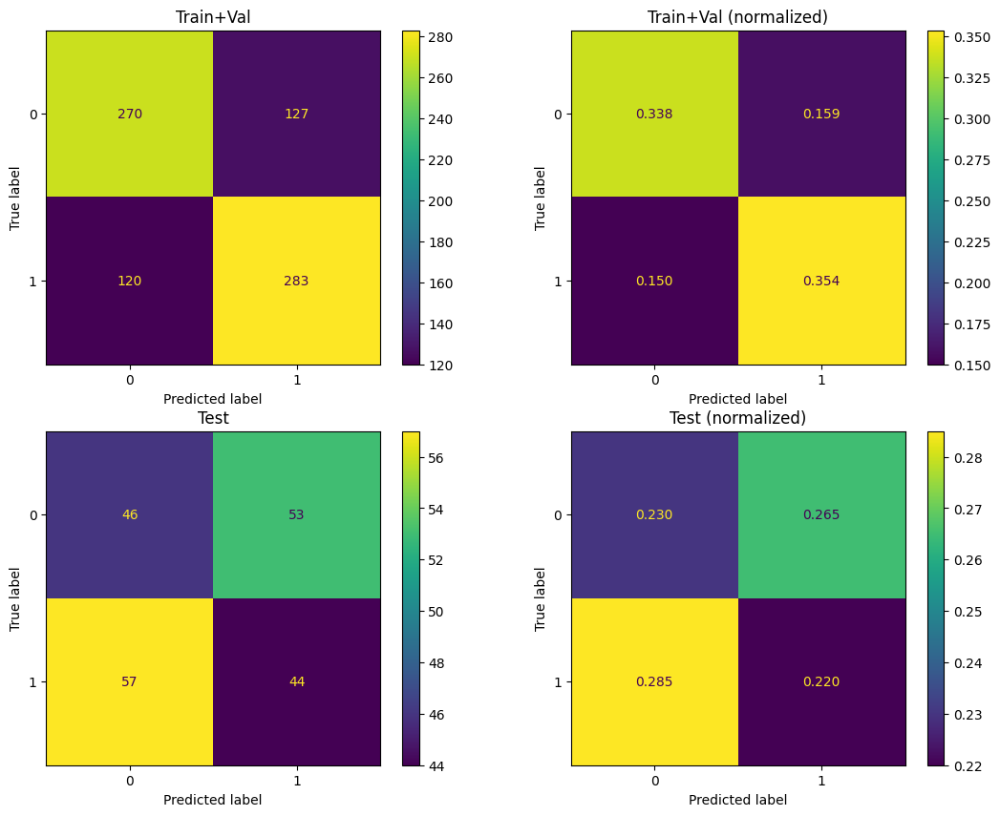

In [495]:
cm_train = confusion_matrix(Y_train, preds_train, labels = tree_model.classes_)
cm_train_norm = confusion_matrix(Y_train, preds_train, labels = tree_model.classes_, normalize = 'all')
cm_test = confusion_matrix(Y_test, preds_test, labels = tree_model.classes_)
cm_test_norm = confusion_matrix(Y_test, preds_test, labels = tree_model.classes_, normalize = 'all')

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (13, 10))
ConfusionMatrixDisplay(confusion_matrix = cm_train, display_labels = tree_model.classes_).plot(ax = ax1, values_format = ',.0f')
ConfusionMatrixDisplay(confusion_matrix = cm_train_norm, display_labels = tree_model.classes_).plot(ax = ax2, values_format = '.3f')
ConfusionMatrixDisplay(confusion_matrix = cm_test, display_labels = tree_model.classes_).plot(ax = ax3, values_format = ',.0f')
ConfusionMatrixDisplay(confusion_matrix = cm_test_norm, display_labels = tree_model.classes_).plot(ax = ax4, values_format = '.3f')

ax1.set_title('Train+Val')
ax2.set_title('Train+Val (normalized)')
ax3.set_title('Test')
ax4.set_title('Test (normalized)')
plt.show()

In [496]:
pd.DataFrame([
    {
        'Train+Val': accuracy_score(Y_train, preds_train),
        'Test': accuracy_score(Y_test, preds_test)
    },
    {
        'Train+Val': precision_score(Y_train, preds_train),
        'Test': precision_score(Y_test, preds_test)
    },
    {
        'Train+Val': recall_score(Y_train, preds_train),
        'Test': recall_score(Y_test, preds_test)
    },
    {
        'Train+Val': f1_score(Y_train, preds_train),
        'Test': f1_score(Y_test, preds_test)
    }
], index = ['Accuracy', 'Precision', 'Recall', 'F1'])

,Train+Val,Test
Accuracy,0.691250,0.450000
Precision,0.690244,0.453608
Recall,0.702233,0.435644
F1,0.696187,0.444444
